In [1]:
from google.colab import drive
drive.mount('/content/drive')


Mounted at /content/drive


In [5]:
import os
detection_dataset ="/content/drive/MyDrive/Student/Ovi/Data_Set/teeth_enum.v1i.yolov8.zip"
os.system(f'unzip "{detection_dataset}" -d /content/Detection')


0

Train-Set


In [6]:
import os
from collections import defaultdict

# === Initialize a dictionary to count class instances ===
class_counts = defaultdict(int)

TRAIN_LABEL_FOLDER = '/content/Detection/train/labels'

# === Iterate over all TXT files in the label folder ===
for filename in os.listdir(TRAIN_LABEL_FOLDER):
    if filename.endswith('.txt'):
        txt_path = os.path.join(TRAIN_LABEL_FOLDER, filename)

        with open(txt_path, 'r', encoding='utf-8') as f:
            lines = f.readlines()

        for line in lines:
            parts = line.strip().split()
            if len(parts) > 0:
                class_id = int(parts[0])  # convert to int for sorting
                class_counts[class_id] += 1

# === Print the class counts in ascending order ===
print("Class instance counts across the dataset:")
for cls in sorted(class_counts.keys()):
    print(f"{cls}: {class_counts[cls]}")


Class instance counts across the dataset:
0: 1236
1: 1212
2: 1233
3: 1233
4: 1251
5: 1192
6: 1121
7: 962
8: 771
9: 913
10: 671
11: 972
12: 973
13: 1139
14: 1076
15: 1099
16: 1114
17: 992
18: 934
19: 948
20: 1081
21: 694
22: 695
23: 889
24: 752
25: 1040
26: 1101
27: 1189
28: 1251
29: 1131
30: 1094
31: 693


In [ ]:
import os
import glob as glob
import matplotlib.pyplot as plt
import cv2
import requests
import random
import numpy as np

In [11]:
import os

im_path = "/content/Detection/train/images"

# List all files in the folder that are images
image_extensions = (".jpg", ".jpeg", ".png", ".bmp", ".tif", ".tiff")
image_files = [f for f in os.listdir(im_path) if f.lower().endswith(image_extensions)]

print(f"Total images: {len(image_files)}")


Total images: 1263


In [12]:
!pip install labelme

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.4/1.4 MB 61.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.2/2.2 MB 7.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 8.2/8.2 MB 113.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 61.1/61.1 MB 40.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.7/7.7 MB 106.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 61.6/61.6 kB 5.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 16.5/16.5 MB 94.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 281.9/281.9 kB 23.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 46.0/46.0 kB 4.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 86.8/86.8 kB 8.1 MB/s eta 0:00:00


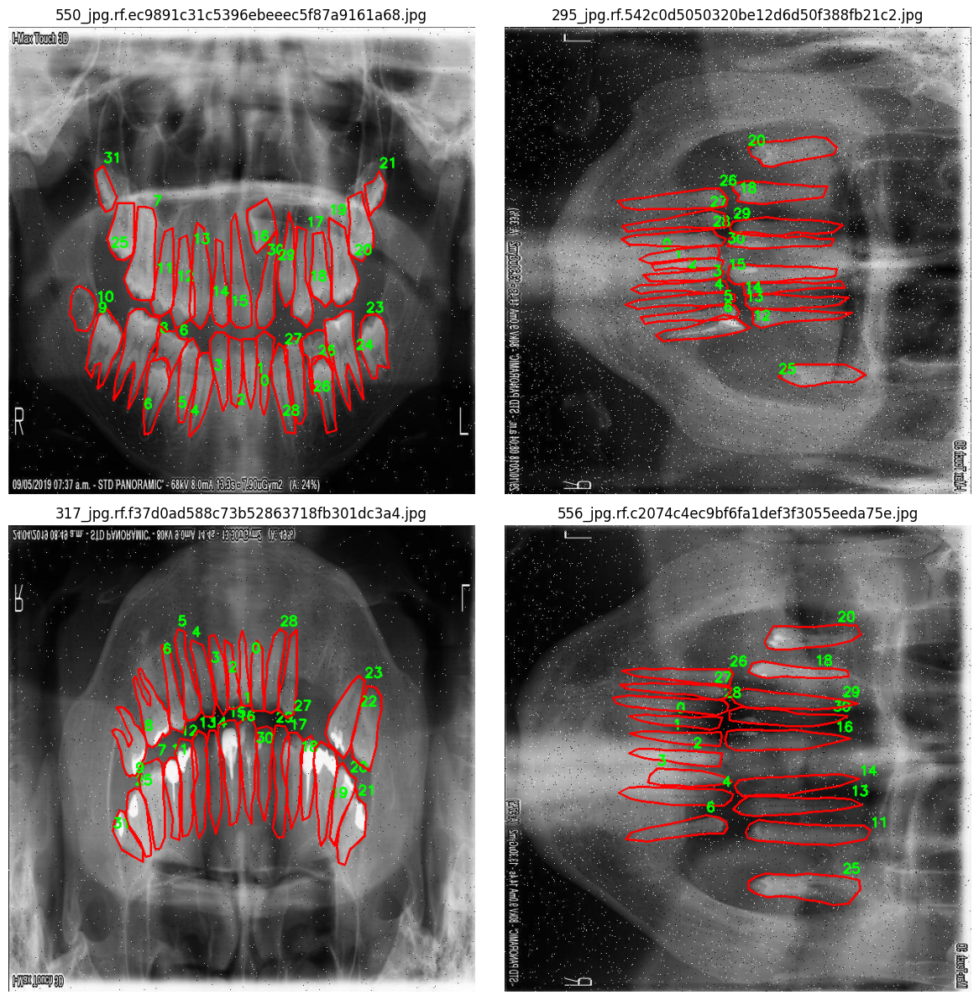

In [13]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
import random

# Paths
IMAGE_FOLDER = '/content/Detection/train/images'
LABEL_FOLDER = '/content/Detection/train/labels'

# Pick 4 random images
all_images = [f for f in os.listdir(IMAGE_FOLDER) if f.lower().endswith(('.jpg', '.png'))]
random_images = random.sample(all_images, 4)

# Plot 4 images with labels
plt.figure(figsize=(12, 12))

for idx, filename in enumerate(random_images, 1):
    image_path = os.path.join(IMAGE_FOLDER, filename)
    label_path = os.path.join(LABEL_FOLDER, filename.rsplit('.', 1)[0] + ".txt")

    # Load image
    image = cv2.imread(image_path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    h, w, _ = image.shape

    # Load labels
    if os.path.exists(label_path):
        with open(label_path, "r", encoding="utf-8") as f:
            lines = f.readlines()

        for line in lines:
            parts = line.strip().split()
            class_id = int(parts[0])
            coords = list(map(float, parts[1:]))

            # Convert normalized coords → pixel coords
            polygon = []
            for i in range(0, len(coords), 2):
                x = int(coords[i] * w)
                y = int(coords[i+1] * h)
                polygon.append((x, y))

            # Draw polygon
            pts = np.array(polygon, np.int32).reshape((-1, 1, 2))
            cv2.polylines(image, [pts], isClosed=True, color=(255, 0, 0), thickness=2)

            # Put class_id text
            x_text, y_text = polygon[0]
            cv2.putText(image, str(class_id), (x_text, y_text-5),
                        cv2.FONT_HERSHEY_SIMPLEX, 0.6, (0, 255, 0), 2)

    # Show subplot
    plt.subplot(2, 2, idx)
    plt.imshow(image)
    plt.title(filename)
    plt.axis("off")

plt.tight_layout()
plt.show()


In [14]:
!cat /content/Detection/data.yaml

train: ../train/images
val: ../valid/images
test: ../test/images

nc: 32
names: ['10', '11', '12', '13', '14', '15', '16', '17', '18', '19', '20', '21', '22', '23', '24', '25', '26', '27', '28', '29', '30', '31', '32', '4', '5', '6', '7', '8', '9', 'License- CC BY 4-0', 'Provided by a Roboflow user', 'https-universe-roboflow-com-salud360-dental-qbbud']

roboflow:
  workspace: project-bm6qr
  project: teeth_enum
  version: 1
  license: CC BY 4.0
  url: https://universe.roboflow.com/project-bm6qr/teeth_enum/dataset/1

In [15]:

# Then reinstall with dependencies
!pip install ultralytics
!pip install torch torchvision

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 59.5 MB/s eta 0:00:00


In [16]:
!git clone https://github.com/ultralytics/ultralytics.git
%cd ultralytics

# Install YOLOv8 package
!pip install -e .


Cloning into 'ultralytics'...
remote: Enumerating objects: 62497, done.
remote: Counting objects: 100% (543/543), done.
remote: Compressing objects: 100% (284/284), done.
remote: Total 62497 (delta 450), reused 259 (delta 259), pack-reused 61954 (from 4)
Receiving objects: 100% (62497/62497), 34.20 MiB | 16.24 MiB/s, done.
Resolving deltas: 100% (46428/46428), done.
/content/ultralytics
Obtaining file:///content/ultralytics
  Installing build dependencies ... done
  Checking if build backend supports build_editable ... done
  Getting requirements to build editable ... done
  Preparing editable metadata (pyproject.toml) ... done
  Building editable for ultralytics (pyproject.toml) ... done
  Created wheel for ultralytics: filename=ultralytics-8.3.182-0.editable-py3-none-any.whl size=23154 sha256=41fc205f4de3e1a5e6d497f1fa918fa4b7fae008162f6f8dcf4bcc8e8f43635e
  Stored in directory: /tmp/pip-ephem-wheel-cache-5y8vrfbv/wheels/60/e0/59/e2f034f296abbdca5c21e3f5be76b9ca685f13c7bd17f8b58c
Suc

In [17]:
from ultralytics import YOLO

# Load YOLOv8n pretrained model
model = YOLO("yolov8n.pt")

# Train the model
model.train(
    data="/content/Detection/data.yaml",  # path to your dataset YAML
    epochs=150,
    batch=16,
    imgsz=320,
    patience=15,     # early stopping patience
    name="dental_caries_yolov8n"
)



Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


Ultralytics 8.3.182 🚀 Python-3.12.11 torch-2.8.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/Detection/data.yaml, degrees=0.0, deterministic=True, device=None, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=150, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=320, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov8n.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=dental_caries_yolov8n, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask=True, patience=15, perspective=0.0, plots=True, pose=

Overriding model.yaml nc=80 with nc=32

                   from  n    params  module                                       arguments                     
  0                  -1  1       464  ultralytics.nn.modules.conv.Conv             [3, 16, 3, 2]                 
  1                  -1  1      4672  ultralytics.nn.modules.conv.Conv             [16, 32, 3, 2]                
  2                  -1  1      7360  ultralytics.nn.modules.block.C2f             [32, 32, 1, True]             
  3                  -1  1     18560  ultralytics.nn.modules.conv.Conv             [32, 64, 3, 2]                
  4                  -1  2     49664  ultralytics.nn.modules.block.C2f             [64, 64, 2, True]             
  5                  -1  1     73984  ultralytics.nn.modules.conv.Conv             [64, 128, 3, 2]               
  6                  -1  2    197632  ultralytics.nn.modules.block.C2f             [128, 128, 2, True]           
  7                  -1  1    295424  ultralytic

Model summary: 129 layers, 3,017,088 parameters, 3,017,072 gradients, 8.2 GFLOPs

Transferred 319/355 items from pretrained weights
Freezing layer 'model.22.dfl.conv.weight'
AMP: running Automatic Mixed Precision (AMP) checks...


AMP: checks passed ✅
train: Fast image access ✅ (ping: 0.0±0.0 ms, read: 1572.9±905.6 MB/s, size: 66.8 KB)


train: Scanning /content/Detection/train/labels... 1263 images, 3 backgrounds, 0 corrupt: 100%|██████████| 1263/1263 [00:01<00:00, 694.16it/s]


train: New cache created: /content/Detection/train/labels.cache
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 773.0±413.3 MB/s, size: 40.6 KB)


val: Scanning /content/Detection/valid/labels... 116 images, 0 backgrounds, 0 corrupt: 100%|██████████| 116/116 [00:00<00:00, 563.09it/s]

val: New cache created: /content/Detection/valid/labels.cache


Plotting labels to /content/ultralytics/runs/detect/dental_caries_yolov8n/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.000278, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
Image sizes 320 train, 320 val
Using 8 dataloader workers
Logging results to /content/ultralytics/runs/detect/dental_caries_yolov8n
Starting training for 150 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      1/150     0.811G      2.791      5.187      1.666        479        320: 100%|██████████| 79/79 [00:26<00:00,  2.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.83it/s]

                   all        116       2968     0.0276     0.0707      0.017    0.00918



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      2/150      0.83G      1.997       4.47      1.214        579        320: 100%|██████████| 79/79 [00:22<00:00,  3.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.70it/s]

                   all        116       2968     0.0502      0.558     0.0962     0.0573



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      3/150     0.914G      1.903      3.857      1.154        550        320: 100%|██████████| 79/79 [00:22<00:00,  3.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.20it/s]

                   all        116       2968      0.231      0.314      0.152     0.0898



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      4/150     0.932G      1.871       3.28      1.136        685        320: 100%|██████████| 79/79 [00:23<00:00,  3.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.74it/s]

                   all        116       2968      0.178      0.393       0.19      0.116



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      5/150     0.949G      1.817      2.831      1.122        506        320: 100%|██████████| 79/79 [00:22<00:00,  3.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.33it/s]

                   all        116       2968      0.203      0.506      0.233      0.143



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      6/150     0.965G      1.754      2.517      1.111        707        320: 100%|██████████| 79/79 [00:23<00:00,  3.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.30it/s]

                   all        116       2968      0.232      0.573      0.288      0.176



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      7/150     0.982G      1.709      2.317      1.105        637        320: 100%|██████████| 79/79 [00:23<00:00,  3.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.96it/s]

                   all        116       2968      0.249      0.613       0.29      0.176



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      8/150         1G      1.668      2.188      1.103        558        320: 100%|██████████| 79/79 [00:22<00:00,  3.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.61it/s]


                   all        116       2968      0.262      0.633      0.299       0.18

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      9/150      1.02G      1.652      2.088      1.097        629        320: 100%|██████████| 79/79 [00:23<00:00,  3.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.98it/s]

                   all        116       2968      0.316      0.647      0.372      0.231



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     10/150      1.03G      1.622      2.013      1.093        589        320: 100%|██████████| 79/79 [00:23<00:00,  3.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.31it/s]


                   all        116       2968      0.311      0.676      0.367      0.227

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     11/150      1.05G      1.592      1.939      1.092        413        320: 100%|██████████| 79/79 [00:23<00:00,  3.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.17it/s]

                   all        116       2968      0.315      0.676      0.382      0.237



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     12/150      1.07G      1.582      1.889      1.088        547        320: 100%|██████████| 79/79 [00:22<00:00,  3.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.71it/s]

                   all        116       2968       0.34      0.697       0.41      0.253



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     13/150      1.09G      1.561      1.834      1.082        643        320: 100%|██████████| 79/79 [00:22<00:00,  3.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.83it/s]

                   all        116       2968      0.354      0.702      0.434      0.266



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     14/150       1.1G       1.57      1.805      1.081        659        320: 100%|██████████| 79/79 [00:22<00:00,  3.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.81it/s]

                   all        116       2968      0.368      0.725      0.437      0.271



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     15/150      1.12G      1.541      1.773      1.079        670        320: 100%|██████████| 79/79 [00:23<00:00,  3.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.75it/s]

                   all        116       2968      0.372      0.731      0.445      0.275



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     16/150      1.14G      1.525      1.737       1.08        640        320: 100%|██████████| 79/79 [00:23<00:00,  3.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.02it/s]

                   all        116       2968      0.373      0.729      0.469      0.292



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     17/150      1.15G       1.53      1.711      1.075        528        320: 100%|██████████| 79/79 [00:21<00:00,  3.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.26it/s]


                   all        116       2968      0.405      0.758      0.471      0.296

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     18/150      1.17G      1.497       1.68      1.079        396        320: 100%|██████████| 79/79 [00:24<00:00,  3.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.07it/s]

                   all        116       2968      0.401      0.778      0.471      0.295



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     19/150      1.19G      1.515      1.669       1.07        585        320: 100%|██████████| 79/79 [00:23<00:00,  3.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.66it/s]

                   all        116       2968      0.425      0.749      0.518      0.328



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     20/150      1.21G      1.509      1.661       1.07        547        320: 100%|██████████| 79/79 [00:22<00:00,  3.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.12it/s]

                   all        116       2968      0.417      0.747      0.482      0.302



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     21/150      1.22G      1.488      1.625       1.07        446        320: 100%|██████████| 79/79 [00:24<00:00,  3.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.85it/s]

                   all        116       2968      0.402      0.767      0.466      0.295



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     22/150      1.24G      1.486      1.603      1.068        564        320: 100%|██████████| 79/79 [00:23<00:00,  3.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.12it/s]

                   all        116       2968      0.412      0.794      0.484      0.302



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     23/150      1.26G       1.46      1.577      1.066        442        320: 100%|██████████| 79/79 [00:22<00:00,  3.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.94it/s]


                   all        116       2968      0.414      0.806      0.476      0.298

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     24/150      1.27G      1.467      1.573      1.062        495        320: 100%|██████████| 79/79 [00:22<00:00,  3.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.07it/s]

                   all        116       2968       0.43      0.812      0.514      0.326



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     25/150      1.29G      1.455      1.553      1.066        538        320: 100%|██████████| 79/79 [00:23<00:00,  3.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.28it/s]

                   all        116       2968      0.444      0.804      0.509      0.322



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     26/150      1.31G      1.464      1.549      1.068        511        320: 100%|██████████| 79/79 [00:22<00:00,  3.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.23it/s]

                   all        116       2968      0.431      0.817      0.477      0.302



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     27/150      1.32G      1.456      1.533      1.063        570        320: 100%|██████████| 79/79 [00:23<00:00,  3.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.22it/s]

                   all        116       2968      0.434      0.833      0.495      0.316



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     28/150      1.34G      1.439      1.522      1.064        459        320: 100%|██████████| 79/79 [00:22<00:00,  3.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.69it/s]

                   all        116       2968      0.433      0.811      0.487      0.307



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     29/150      1.36G      1.461      1.517      1.056        694        320: 100%|██████████| 79/79 [00:23<00:00,  3.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.89it/s]

                   all        116       2968      0.446      0.817      0.531      0.338



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     30/150      1.38G      1.446      1.506      1.057        555        320: 100%|██████████| 79/79 [00:22<00:00,  3.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.74it/s]

                   all        116       2968      0.464      0.799      0.575      0.367



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     31/150      1.39G      1.448      1.497       1.06        612        320: 100%|██████████| 79/79 [00:23<00:00,  3.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.17it/s]

                   all        116       2968      0.482      0.801      0.598      0.385



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     32/150      1.41G      1.436      1.477      1.053        602        320: 100%|██████████| 79/79 [00:23<00:00,  3.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.18it/s]

                   all        116       2968      0.452      0.835      0.549      0.354



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     33/150      1.43G       1.44      1.486      1.056        520        320: 100%|██████████| 79/79 [00:23<00:00,  3.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.26it/s]

                   all        116       2968      0.454      0.828      0.548       0.35



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     34/150      1.44G      1.426      1.463      1.056        531        320: 100%|██████████| 79/79 [00:23<00:00,  3.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.42it/s]


                   all        116       2968       0.47      0.815      0.582      0.374

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     35/150      1.53G      1.437       1.45      1.052        570        320: 100%|██████████| 79/79 [00:23<00:00,  3.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.60it/s]

                   all        116       2968      0.517      0.782       0.64      0.411



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     36/150      1.55G      1.436      1.448      1.056        684        320: 100%|██████████| 79/79 [00:22<00:00,  3.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.88it/s]

                   all        116       2968      0.533      0.789      0.635      0.399



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     37/150      1.56G      1.421      1.418      1.051        459        320: 100%|██████████| 79/79 [00:23<00:00,  3.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.99it/s]


                   all        116       2968      0.586      0.774      0.711      0.462

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     38/150      1.58G      1.415      1.411      1.053        515        320: 100%|██████████| 79/79 [00:22<00:00,  3.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.47it/s]

                   all        116       2968      0.573      0.796      0.719      0.465



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     39/150       1.6G      1.418      1.396      1.053        575        320: 100%|██████████| 79/79 [00:23<00:00,  3.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.33it/s]


                   all        116       2968      0.592      0.819      0.715      0.457

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     40/150      1.62G      1.398       1.37      1.054        693        320: 100%|██████████| 79/79 [00:22<00:00,  3.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.79it/s]

                   all        116       2968      0.679      0.789      0.775      0.496



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     41/150      1.63G       1.42      1.359      1.055        452        320: 100%|██████████| 79/79 [00:22<00:00,  3.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.28it/s]


                   all        116       2968      0.625      0.818      0.753      0.478

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     42/150      1.65G      1.417      1.348      1.049        693        320: 100%|██████████| 79/79 [00:23<00:00,  3.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.15it/s]

                   all        116       2968      0.706      0.812      0.802      0.517



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     43/150      1.67G      1.416      1.325       1.05        531        320: 100%|██████████| 79/79 [00:23<00:00,  3.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.14it/s]

                   all        116       2968      0.771      0.829      0.856      0.544



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     44/150      1.69G      1.414      1.316      1.053        891        320: 100%|██████████| 79/79 [00:23<00:00,  3.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.77it/s]

                   all        116       2968      0.773      0.838      0.872      0.559



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     45/150       1.7G      1.394      1.279      1.047        861        320: 100%|██████████| 79/79 [00:22<00:00,  3.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.31it/s]

                   all        116       2968      0.785      0.845      0.879      0.562



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     46/150      1.72G      1.406       1.26      1.048        646        320: 100%|██████████| 79/79 [00:24<00:00,  3.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.45it/s]

                   all        116       2968      0.829      0.841      0.889      0.564



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     47/150      1.74G      1.394      1.229      1.046        551        320: 100%|██████████| 79/79 [00:23<00:00,  3.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.92it/s]

                   all        116       2968        0.8       0.85      0.893      0.571



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     48/150      1.75G      1.389       1.21      1.039        607        320: 100%|██████████| 79/79 [00:22<00:00,  3.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.13it/s]

                   all        116       2968      0.804      0.862      0.897      0.575



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     49/150      1.77G      1.398        1.2      1.048        566        320: 100%|██████████| 79/79 [00:23<00:00,  3.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.05it/s]

                   all        116       2968      0.829      0.876      0.911      0.581



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     50/150      1.79G      1.401      1.175      1.045        551        320: 100%|██████████| 79/79 [00:22<00:00,  3.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.64it/s]

                   all        116       2968      0.857      0.872      0.918      0.583



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     51/150       1.8G      1.391      1.153      1.047        747        320: 100%|██████████| 79/79 [00:23<00:00,  3.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.25it/s]


                   all        116       2968      0.845      0.859      0.911      0.576

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     52/150      1.82G      1.399      1.161      1.048        559        320: 100%|██████████| 79/79 [00:23<00:00,  3.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.89it/s]


                   all        116       2968      0.864      0.876      0.922      0.591

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     53/150      1.84G      1.394      1.118      1.046        414        320: 100%|██████████| 79/79 [00:22<00:00,  3.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.12it/s]


                   all        116       2968      0.868      0.891      0.929      0.597

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     54/150      1.86G      1.393      1.117      1.042        800        320: 100%|██████████| 79/79 [00:22<00:00,  3.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.91it/s]

                   all        116       2968      0.858      0.882      0.924      0.591



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     55/150      1.87G       1.38      1.088      1.043        601        320: 100%|██████████| 79/79 [00:23<00:00,  3.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.88it/s]

                   all        116       2968      0.875      0.884      0.928      0.586



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     56/150      1.89G      1.372      1.079      1.043        496        320: 100%|██████████| 79/79 [00:22<00:00,  3.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.14it/s]

                   all        116       2968      0.854      0.893      0.931       0.59



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     57/150      1.91G      1.382      1.096      1.039        541        320: 100%|██████████| 79/79 [00:22<00:00,  3.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.13it/s]

                   all        116       2968      0.874      0.889      0.932      0.599



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     58/150      1.92G      1.385      1.073       1.04        454        320: 100%|██████████| 79/79 [00:23<00:00,  3.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.65it/s]


                   all        116       2968      0.861      0.897      0.934        0.6

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     59/150      1.94G      1.389      1.055      1.035        566        320: 100%|██████████| 79/79 [00:22<00:00,  3.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.85it/s]

                   all        116       2968      0.881      0.894      0.938      0.602



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     60/150      1.96G      1.388      1.056      1.046        607        320: 100%|██████████| 79/79 [00:24<00:00,  3.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.45it/s]

                   all        116       2968      0.874      0.884      0.931      0.596



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     61/150      1.97G      1.378      1.044      1.039        801        320: 100%|██████████| 79/79 [00:22<00:00,  3.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.32it/s]

                   all        116       2968       0.89      0.893      0.937      0.603



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     62/150      1.99G      1.358      1.032      1.038        564        320: 100%|██████████| 79/79 [00:23<00:00,  3.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.40it/s]


                   all        116       2968      0.886      0.903      0.939      0.606

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     63/150      2.01G      1.373      1.022      1.035        629        320: 100%|██████████| 79/79 [00:22<00:00,  3.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.95it/s]

                   all        116       2968       0.89      0.907      0.944      0.604



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     64/150      2.03G      1.375      1.019      1.038        612        320: 100%|██████████| 79/79 [00:23<00:00,  3.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.71it/s]

                   all        116       2968       0.89      0.902      0.941      0.608



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     65/150      2.04G      1.363      1.021      1.042        616        320: 100%|██████████| 79/79 [00:22<00:00,  3.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.97it/s]


                   all        116       2968      0.885      0.902      0.939      0.605

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     66/150      2.06G      1.369      1.003      1.035        643        320: 100%|██████████| 79/79 [00:23<00:00,  3.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.24it/s]

                   all        116       2968      0.891      0.902      0.942      0.604



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     67/150      2.08G      1.372      1.005       1.04        570        320: 100%|██████████| 79/79 [00:23<00:00,  3.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.38it/s]


                   all        116       2968      0.892      0.893       0.94        0.6

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     68/150      2.09G      1.362     0.9903      1.035        496        320: 100%|██████████| 79/79 [00:23<00:00,  3.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.16it/s]


                   all        116       2968      0.897      0.903      0.942      0.609

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     69/150      2.11G      1.359     0.9868      1.036        565        320: 100%|██████████| 79/79 [00:23<00:00,  3.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.85it/s]


                   all        116       2968      0.887      0.894      0.938      0.606

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     70/150      2.13G      1.362     0.9833      1.037        426        320: 100%|██████████| 79/79 [00:23<00:00,  3.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.86it/s]

                   all        116       2968      0.884      0.889      0.937      0.605



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     71/150      2.15G      1.354     0.9843      1.035        647        320: 100%|██████████| 79/79 [00:23<00:00,  3.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.97it/s]

                   all        116       2968      0.891      0.908       0.94      0.612



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     72/150      2.16G      1.352     0.9679      1.038        604        320: 100%|██████████| 79/79 [00:22<00:00,  3.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.84it/s]


                   all        116       2968      0.889      0.901      0.943      0.611

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     73/150      2.18G      1.359     0.9808      1.033        507        320: 100%|██████████| 79/79 [00:22<00:00,  3.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.06it/s]


                   all        116       2968      0.884      0.873      0.933      0.598

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     74/150       2.2G      1.358     0.9774      1.032        534        320: 100%|██████████| 79/79 [00:23<00:00,  3.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.77it/s]


                   all        116       2968      0.895      0.898      0.942      0.608

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     75/150      2.21G      1.357     0.9635      1.029        501        320: 100%|██████████| 79/79 [00:23<00:00,  3.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.16it/s]

                   all        116       2968      0.903      0.896      0.941       0.61



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     76/150      2.23G      1.352      0.958      1.029        546        320: 100%|██████████| 79/79 [00:22<00:00,  3.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.01it/s]

                   all        116       2968      0.896      0.896      0.941      0.599



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     77/150      2.25G      1.342     0.9438      1.034        499        320: 100%|██████████| 79/79 [00:23<00:00,  3.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.03it/s]

                   all        116       2968      0.905      0.898      0.946      0.614



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     78/150      2.27G      1.355     0.9518      1.034        545        320: 100%|██████████| 79/79 [00:23<00:00,  3.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.05it/s]


                   all        116       2968      0.892      0.906      0.944      0.609

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     79/150      2.28G      1.341     0.9415      1.032        592        320: 100%|██████████| 79/79 [00:23<00:00,  3.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.22it/s]

                   all        116       2968      0.893      0.909      0.944      0.608



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     80/150       2.3G      1.348     0.9364      1.025        784        320: 100%|██████████| 79/79 [00:23<00:00,  3.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.22it/s]

                   all        116       2968       0.91      0.894      0.944      0.614



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     81/150      2.32G      1.341      0.933      1.028        573        320: 100%|██████████| 79/79 [00:21<00:00,  3.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.92it/s]


                   all        116       2968      0.907      0.898      0.946      0.616

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     82/150      2.33G      1.344     0.9308      1.027        572        320: 100%|██████████| 79/79 [00:23<00:00,  3.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.50it/s]


                   all        116       2968      0.902      0.902      0.947      0.609

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     83/150      2.35G      1.342     0.9434      1.031        544        320: 100%|██████████| 79/79 [00:23<00:00,  3.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.27it/s]

                   all        116       2968      0.893      0.914      0.948      0.617



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     84/150      2.37G      1.337     0.9238      1.027        490        320: 100%|██████████| 79/79 [00:23<00:00,  3.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.98it/s]

                   all        116       2968      0.906      0.906      0.947      0.612



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     85/150      2.38G      1.339     0.9183      1.026        476        320: 100%|██████████| 79/79 [00:23<00:00,  3.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.53it/s]

                   all        116       2968      0.902      0.906      0.947      0.616



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     86/150       2.4G      1.356     0.9552      1.038        583        320: 100%|██████████| 79/79 [00:23<00:00,  3.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.34it/s]

                   all        116       2968      0.908      0.898      0.945      0.612



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     87/150      2.42G      1.339     0.9152      1.025        640        320: 100%|██████████| 79/79 [00:23<00:00,  3.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.68it/s]


                   all        116       2968        0.9      0.901      0.944       0.61

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     88/150      2.44G      1.339     0.9246      1.032        756        320: 100%|██████████| 79/79 [00:23<00:00,  3.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.47it/s]


                   all        116       2968      0.904      0.902      0.946      0.611

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     89/150      2.45G      1.338     0.9094      1.029        552        320: 100%|██████████| 79/79 [00:23<00:00,  3.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.91it/s]

                   all        116       2968      0.902       0.91      0.949      0.614



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     90/150      2.47G      1.338     0.9078      1.028        608        320: 100%|██████████| 79/79 [00:22<00:00,  3.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.60it/s]


                   all        116       2968      0.903      0.911      0.952      0.614

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     91/150      2.49G      1.342     0.9144      1.027        628        320: 100%|██████████| 79/79 [00:23<00:00,  3.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.40it/s]


                   all        116       2968      0.906      0.903      0.948      0.617

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     92/150       2.5G      1.345     0.9118      1.026        569        320: 100%|██████████| 79/79 [00:23<00:00,  3.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.84it/s]

                   all        116       2968      0.898      0.915      0.949      0.617



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     93/150      2.52G      1.333     0.9036      1.027        622        320: 100%|██████████| 79/79 [00:22<00:00,  3.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.08it/s]

                   all        116       2968      0.904      0.901      0.947      0.615



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     94/150      2.54G      1.326     0.9042      1.025        499        320: 100%|██████████| 79/79 [00:23<00:00,  3.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.91it/s]

                   all        116       2968      0.905      0.902      0.946      0.613



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     95/150      2.55G      1.326     0.8942      1.023        411        320: 100%|██████████| 79/79 [00:23<00:00,  3.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.12it/s]

                   all        116       2968      0.915      0.903      0.948      0.615



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     96/150      2.57G      1.317     0.8873      1.021        471        320: 100%|██████████| 79/79 [00:23<00:00,  3.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.48it/s]

                   all        116       2968      0.901      0.908      0.945      0.613



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     97/150      2.59G      1.327        0.9      1.022        497        320: 100%|██████████| 79/79 [00:23<00:00,  3.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.10it/s]

                   all        116       2968      0.901      0.912      0.949      0.619



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     98/150      2.61G      1.324     0.8878      1.019        500        320: 100%|██████████| 79/79 [00:23<00:00,  3.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.12it/s]

                   all        116       2968      0.909       0.91      0.952      0.622



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     99/150      2.62G      1.319     0.8895      1.024        645        320: 100%|██████████| 79/79 [00:23<00:00,  3.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.95it/s]

                   all        116       2968      0.895      0.913      0.948      0.617



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    100/150      2.64G       1.32      0.876      1.021        603        320: 100%|██████████| 79/79 [00:24<00:00,  3.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.47it/s]


                   all        116       2968      0.915      0.906       0.95      0.616

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    101/150      2.66G      1.322     0.8859      1.023        637        320: 100%|██████████| 79/79 [00:23<00:00,  3.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.25it/s]

                   all        116       2968      0.909      0.914      0.952      0.621



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    102/150      2.67G      1.325     0.8886      1.026        566        320: 100%|██████████| 79/79 [00:22<00:00,  3.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.56it/s]

                   all        116       2968      0.913      0.915      0.948       0.62



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    103/150      2.69G      1.304     0.8785       1.02        675        320: 100%|██████████| 79/79 [00:22<00:00,  3.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.83it/s]

                   all        116       2968      0.911      0.904      0.948      0.616



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    104/150      2.71G      1.319     0.8786      1.023        716        320: 100%|██████████| 79/79 [00:23<00:00,  3.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.94it/s]

                   all        116       2968      0.904      0.912      0.948      0.614



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    105/150      2.72G      1.326     0.8949      1.024        623        320: 100%|██████████| 79/79 [00:22<00:00,  3.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.12it/s]

                   all        116       2968      0.907       0.91      0.951       0.62



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    106/150      2.74G      1.321     0.8756      1.018        653        320: 100%|██████████| 79/79 [00:23<00:00,  3.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.07it/s]

                   all        116       2968      0.914      0.911      0.951      0.622



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    107/150      2.76G      1.314      0.869      1.022        610        320: 100%|██████████| 79/79 [00:22<00:00,  3.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.63it/s]

                   all        116       2968      0.906      0.912       0.95      0.618



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    108/150      2.78G      1.317     0.8806       1.02        568        320: 100%|██████████| 79/79 [00:22<00:00,  3.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.15it/s]

                   all        116       2968      0.905      0.905      0.951      0.621



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    109/150      2.79G      1.316     0.8687      1.017        540        320: 100%|██████████| 79/79 [00:23<00:00,  3.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.59it/s]

                   all        116       2968       0.91      0.915       0.95      0.621



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    110/150      2.81G      1.318     0.8582      1.017        696        320: 100%|██████████| 79/79 [00:23<00:00,  3.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.46it/s]

                   all        116       2968      0.909       0.91      0.951      0.621



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    111/150      2.83G      1.311     0.8656      1.017        661        320: 100%|██████████| 79/79 [00:22<00:00,  3.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.71it/s]

                   all        116       2968      0.907      0.916      0.951      0.621



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    112/150      2.85G      1.317     0.8703       1.02        596        320: 100%|██████████| 79/79 [00:24<00:00,  3.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  3.28it/s]


                   all        116       2968      0.903      0.915       0.95      0.618

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    113/150      2.86G      1.311     0.8668      1.019        522        320: 100%|██████████| 79/79 [00:22<00:00,  3.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.94it/s]

                   all        116       2968      0.911       0.91      0.949      0.618



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    114/150      2.88G      1.309     0.8652      1.018        535        320: 100%|██████████| 79/79 [00:23<00:00,  3.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.20it/s]

                   all        116       2968      0.906      0.912      0.949      0.616



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    115/150       2.9G      1.312     0.8578      1.011        477        320: 100%|██████████| 79/79 [00:23<00:00,  3.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.47it/s]

                   all        116       2968      0.906      0.912      0.948      0.618



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    116/150      2.91G      1.306     0.8557      1.017        600        320: 100%|██████████| 79/79 [00:23<00:00,  3.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.24it/s]

                   all        116       2968      0.909      0.914      0.952      0.619



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    117/150      2.93G      1.316     0.8677      1.023        590        320: 100%|██████████| 79/79 [00:23<00:00,  3.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.26it/s]

                   all        116       2968      0.907      0.908      0.948      0.616



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    118/150      2.95G      1.306     0.8567      1.014        710        320: 100%|██████████| 79/79 [00:22<00:00,  3.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.78it/s]

                   all        116       2968      0.896      0.908      0.945      0.615



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    119/150      2.96G      1.313     0.8488      1.019        594        320: 100%|██████████| 79/79 [00:22<00:00,  3.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.86it/s]

                   all        116       2968      0.906      0.917      0.949      0.618



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    120/150      2.98G      1.317     0.8479      1.013        714        320: 100%|██████████| 79/79 [00:23<00:00,  3.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.10it/s]

                   all        116       2968      0.906      0.904      0.947      0.615



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    121/150         3G      1.301     0.8495      1.016        521        320: 100%|██████████| 79/79 [00:23<00:00,  3.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.27it/s]

                   all        116       2968        0.9      0.919       0.95       0.62
EarlyStopping: Training stopped early as no improvement observed in last 15 epochs. Best results observed at epoch 106, best model saved as best.pt.
To update EarlyStopping(patience=15) pass a new patience value, i.e. `patience=300` or use `patience=0` to disable EarlyStopping.



121 epochs completed in 0.864 hours.
Optimizer stripped from /content/ultralytics/runs/detect/dental_caries_yolov8n/weights/last.pt, 6.2MB
Optimizer stripped from /content/ultralytics/runs/detect/dental_caries_yolov8n/weights/best.pt, 6.2MB

Validating /content/ultralytics/runs/detect/dental_caries_yolov8n/weights/best.pt...
Ultralytics 8.3.182 🚀 Python-3.12.11 torch-2.8.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
Model summary (fused): 72 layers, 3,011,888 parameters, 0 gradients, 8.1 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:03<00:00,  1.32it/s]


                   all        116       2968      0.914      0.911      0.952      0.622
                    10        113        113      0.937      0.921       0.97      0.586
                    11        113        113      0.949      0.876      0.935      0.462
                    12        112        112      0.891       0.92      0.938      0.502
                    13        114        114      0.935      0.881      0.947      0.511
                    14        112        115      0.939      0.945      0.953      0.613
                    15        108        110      0.881      0.936      0.927      0.595
                    16         93         95      0.881      0.968      0.956      0.615
                    17         85         86      0.922      0.919      0.973      0.718
                    18         71         72      0.972      0.944      0.978      0.737
                    19         80         80      0.883      0.942       0.97       0.73
                    2

ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7d5ed7a26f90>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,

In [ ]:
%load_ext tensorboard
%tensorboard --logdir runs

Output hidden; open in https://colab.research.google.com to view.

In [20]:
from ultralytics import YOLO

# Load your trained YOLOv8n model
model = YOLO("/content/ultralytics/runs/detect/dental_caries_yolov8n/weights/best.pt")  # path to your trained weights

# Run evaluation on validation or test set
results = model.val(
    data="/content/Detection/data.yaml",  # dataset YAML
    imgsz=320,
    batch=16,
    iou=0.5,
    augment=True   # <-- enables test time augmentation (TTA)
)


Ultralytics 8.3.182 🚀 Python-3.12.11 torch-2.8.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
Model summary (fused): 72 layers, 3,011,888 parameters, 0 gradients, 8.1 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 1277.4±344.6 MB/s, size: 38.6 KB)


val: Scanning /content/Detection/valid/labels.cache... 116 images, 0 backgrounds, 0 corrupt: 100%|██████████| 116/116 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:03<00:00,  2.11it/s]


                   all        116       2968      0.905      0.928      0.952      0.611
                    10        113        113      0.946      0.928      0.978      0.577
                    11        113        113      0.932      0.854      0.929      0.435
                    12        112        112      0.853      0.911      0.935      0.465
                    13        114        114      0.904      0.904      0.946      0.495
                    14        112        115      0.948      0.942      0.951        0.6
                    15        108        110      0.906      0.945      0.922      0.595
                    16         93         95      0.876      0.979      0.954        0.6
                    17         85         86      0.909      0.942       0.96      0.696
                    18         71         72       0.96      0.958      0.983      0.757
                    19         80         80      0.858      0.983      0.971      0.729
                    2

Prediction

In [22]:
from ultralytics import YOLO

# Load YOLOv8 trained weights
model = YOLO("/content/ultralytics/runs/detect/dental_caries_yolov8n/weights/best.pt")    # path to your trained YOLOv8n

# Run detection on validation images
results = model.predict(
    source="/content/Detection/valid/images",  # folder or single image/video
    imgsz=320,        # input size
    conf=0.25,        # confidence threshold
    save=True,        # save results to runs/detect/predict
    save_txt=True     # save bounding boxes in text files (optional)
)

# Visualize predictions
for r in results:
    print("Image file:", r.path)
    r.show()


Output hidden; open in https://colab.research.google.com to view.

Show Prediction

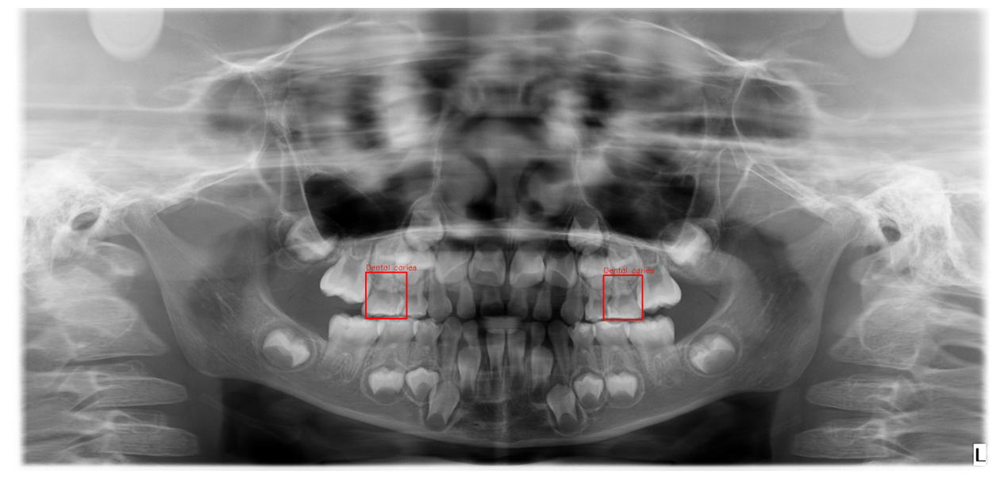

In [ ]:
import cv2
import matplotlib.pyplot as plt

# Paths
img_path ="/content/yolo_dataset/images/val/cate1_005.png"
label_path ="/content/yolo_dataset/labels/val/cate1_005.txt"

# Load image
img = cv2.imread(img_path)
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
h, w, _ = img.shape

# Load YOLO annotations
with open(label_path, 'r') as f:
    lines = f.readlines()

# Class names (must match your dataset)
class_names = [
    'Dental caries'
]

# Draw boxes
for line in lines:
    parts = line.strip().split()
    class_id = int(parts[0])
    x_center, y_center, box_w, box_h = map(float, parts[1:])

    # Convert YOLO format to pixel coordinates
    x1 = int((x_center - box_w / 2) * w)
    y1 = int((y_center - box_h / 2) * h)
    x2 = int((x_center + box_w / 2) * w)
    y2 = int((y_center + box_h / 2) * h)

    # Draw rectangle
    cv2.rectangle(img, (x1, y1), (x2, y2), color=(255,0,0), thickness=2)
    # Put label
    cv2.putText(img, class_names[class_id], (x1, y1-5),
                cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255,0,0), 1)

# Show image
plt.figure(figsize=(16,12))
plt.imshow(img)
plt.axis('off')
plt.show()


In [ ]:
from google.colab import files
files.download('/content/yolov5/runs/train/exp/weights/best.pt')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>